# Style Transfer

<img src="https://i0.wp.com/chelseatroy.com/wp-content/uploads/2018/12/neural_style_transfer.png?resize=768%2C311&ssl=1">

La idea de este trabajo final es reproducir el siguiente paper:

https://arxiv.org/pdf/1508.06576.pdf

El objetivo es transferir el estilo de una imagen dada a otra imagen distinta. 

Como hemos visto en clase, las primeras capas de una red convolucional se activan ante la presencia de ciertos patrones vinculados a detalles muy pequeños.

A medida que avanzamos en las distintas capas de una red neuronal convolucional, los filtros se van activando a medida que detectan patrones de formas cada vez mas complejos.

Lo que propone este paper es asignarle a la activación de las primeras capas de una red neuronal convolucional (por ejemplo VGG19) la definición del estilo y a la activación de las últimas capas de la red neuronal convolucional, la definición del contenido.

La idea de este paper es, a partir de dos imágenes (una que aporte el estilo y otra que aporte el contenido) analizar cómo es la activación de las primeras capas para la imagen que aporta el estilo y cómo es la activación de las últimas capas de la red convolucional para la imagen que aporta el contenido. A partir de esto se intentará sintetizar una imagen que active los filtros de las primeras capas que se activaron con la imagen que aporta el estilo y los filtros de las últimas capas que se activaron con la imagen que aporta el contenido.

A este procedimiento se lo denomina neural style transfer.

# En este trabajo se deberá leer el paper mencionado y en base a ello, entender la implementación que se muestra a continuación y contestar preguntas sobre la misma.

# Una metodología posible es hacer una lectura rápida del paper (aunque esto signifique no entender algunos detalles del mismo) y luego ir analizando el código y respondiendo las preguntas. A medida que se planteen las preguntas, volviendo a leer secciones específicas del paper terminará de entender los detalles que pudieran haber quedado pendientes.

Lo primero que haremos es cargar dos imágenes, una que aporte el estilo y otra que aporte el contenido. A tal fin utilizaremos imágenes disponibles en la web.

In [ ]:
# Imagen para estilo
!wget https://upload.wikimedia.org/wikipedia/commons/5/52/La_noche_estrellada1.jpg

# Imagen para contenido
!wget https://upload.wikimedia.org/wikipedia/commons/thumb/f/f4/Neckarfront_T%C3%BCbingen_Mai_2017.jpg/775px-Neckarfront_T%C3%BCbingen_Mai_2017.jpg

# Creamos el directorio para los archivos de salida
!mkdir /content/output

--2020-06-30 02:06:30--  https://upload.wikimedia.org/wikipedia/commons/5/52/La_noche_estrellada1.jpg
Resolving upload.wikimedia.org (upload.wikimedia.org)... 208.80.153.240, 2620:0:861:ed1a::2:b
Connecting to upload.wikimedia.org (upload.wikimedia.org)|208.80.153.240|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 223725 (218K) [image/jpeg]
Saving to: ‘La_noche_estrellada1.jpg’

La_noche_estrellada 100%[===================>] 218.48K  --.-KB/s    in 0.06s   

2020-06-30 02:06:30 (3.40 MB/s) - ‘La_noche_estrellada1.jpg’ saved [223725/223725]

--2020-06-30 02:06:32--  https://upload.wikimedia.org/wikipedia/commons/thumb/f/f4/Neckarfront_T%C3%BCbingen_Mai_2017.jpg/775px-Neckarfront_T%C3%BCbingen_Mai_2017.jpg
Resolving upload.wikimedia.org (upload.wikimedia.org)... 208.80.154.240, 2620:0:861:ed1a::2:b
Connecting to upload.wikimedia.org (upload.wikimedia.org)|208.80.154.240|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 153015 (149K) [ima

In [78]:
from keras.preprocessing.image import load_img, save_img, img_to_array
import numpy as np
from scipy.optimize import fmin_l_bfgs_b
import time
import argparse

from keras.applications import vgg19
from keras import backend as K
from pathlib import Path

In [79]:
# Definimos las imagenes que vamos a utilizar, y el directorio de salida
base_image_path = Path("/content/775px-Neckarfront_Tübingen_Mai_2017.jpg")
style_reference_image_path = Path("/content/La_noche_estrellada1.jpg")
result_prefix = Path("/content/output")
iterations = 100

# 1) En base a lo visto en el paper ¿Qué significan los parámetros definidos en la siguiente celda?

Respuesta:

- __content_weight__ se corresponde con $\large \alpha $ y representa un factor de ponderacion para la reconstruccion de contenido.
- __style_weight__ se corresponde con $ \large \beta $ y representa un factor de ponderacion para la reconstruccion de estilo. Importa el valor de su relacion con $ \large \alpha $ y suele ser el peso modificado para definir en que medida el estilo es aplicado a la imagen base.
- __total_variation_weight__ es un factor de ponderacion que actua sobre el ruido o suavidad de la imagen resultante.


In [80]:
total_variation_weight = 0.1
style_weight = 10
content_weight = 1

In [81]:
# Definimos el tamaño de las imágenes a utilizar
width, height = load_img(base_image_path).size
img_nrows = 400
img_ncols = int(width * img_nrows / height)

# 2) Explicar qué hace la siguiente celda. En especial las últimas dos líneas de la función antes del return. ¿Por qué?

Ayuda: https://keras.io/applications/

Respuesta:

1. La imagen a procesar se carga en memoria en formato PIL mediante la function de Keras load_img.
2. Mediante la funcion de Keras img_to_array se convierte la imagen en array 3D de Numpy donde las dimensiones corresponden a alto, ancho y canales, y que contiene el valor de cada pixel convertido de entero a punto flotante.
3. Se agrega una dimension adicional al array que representa la imagen, esta dimension pasa a ser la primera y convierte al array en un array 4D de Numpy. Esta dimension adicional permite operar sobre un batch de imagenes.
4. Prepara la imagen para que pueda ser correctamente interpretada por el modelo VGG19, resta la media de los canales RGB correspondientes al dataset de ImageNet, el cual fue el usado en el entrenamiento de VGG19.

La funcion definida en esta celda prepara la imagen para que pueda ser correctamente interpretada por el modelo VGG19.

In [82]:
def preprocess_image(image_path):
    img = load_img(image_path, target_size=(img_nrows, img_ncols))  # 1
    img = img_to_array(img)                                         # 2
    img = np.expand_dims(img, axis=0)                               # 3
    img = vgg19.preprocess_input(img)                               # 4
    return img

# 3) Habiendo comprendido lo que hace la celda anterior, explique de manera muy concisa qué hace la siguiente celda. ¿Qué relación tiene con la celda anterior?

Respuesta:

La funcion __deprocess_image__ espera recibir un array de Numpy al cual le quita una dimension, dejando las que contienen la informacion de los pixeles. Luego a cada canal le devuelve la media que fue restada previamente, ajusta el orden de los canales al modelo de color RGB y finalmente asegura que el valor de cada canal para cada pixel sea entero positivo menor o igual a 255, ya que ese es el rango valido para RGB.

El resultado de aplicar esta funcion a un array de Numpy obtenido de la funcion preprocess_image es otro array de Numpy que contiene los pixeles de la imagen original.

In [83]:
def deprocess_image(x):
    x = x.reshape((img_nrows, img_ncols, 3))
    # Remove zero-center by mean pixel
    x[:, :, 0] += 103.939
    x[:, :, 1] += 116.779
    x[:, :, 2] += 123.68
    # 'BGR'->'RGB'
    x = x[:, :, ::-1]
    x = np.clip(x, 0, 255).astype('uint8')
    return x

In [84]:
# get tensor representations of our images
# K.variable convierte un numpy array en un tensor, para 
base_image = K.variable(preprocess_image(base_image_path))
style_reference_image = K.variable(preprocess_image(style_reference_image_path))

In [85]:
combination_image = K.placeholder((1, img_nrows, img_ncols, 3))

Aclaración:

La siguiente celda sirve para procesar las tres imagenes (contenido, estilo y salida) en un solo batch.

In [86]:
# combine the 3 images into a single Keras tensor
input_tensor = K.concatenate([base_image,
                              style_reference_image,
                              combination_image], axis=0)

In [87]:
# build the VGG19 network with our 3 images as input
# the model will be loaded with pre-trained ImageNet weights
model = vgg19.VGG19(input_tensor=input_tensor,
                    weights='imagenet', include_top=False)
print('Model loaded.')

# get the symbolic outputs of each "key" layer (we gave them unique names).
outputs_dict = dict([(layer.name, layer.output) for layer in model.layers])

Model loaded.


# 4) En la siguientes celdas:

- ¿Qué es la matriz de Gram? ¿Para qué se usa?

La matriz de Gram es aquella cuyas componentes estan definidas por el producto interno de un conjunto de vectores $ v_1,...,v_n $, tal que $G_{ij} = (v_i, v_j) $.

La matriz de Gram es parte de la representacion del estilo de la imagen y continene la correlacion entre las salidas de cada capa de la red VGG. La medida de la correlacion esta dada por el producto vectorial entre los mapas de caracterisitcas (features maps) vectorizados $ i $ y $ j $ correspondientes a la capa $ l $, $ G^l_{ij} = \sum_k F^l_{ik} F^l_{jk} $. Este producto vectorial indica cuan similares o distintas son las caracteristicas extraidas por la capa correspondiente.

Medir la similitud entre el contenido de varios mapas de caracteristicas (feature maps) correspondientes a una misma capa convolucional ayuda a la red a aprender una representacion de la imagen. La matriz de Gram para una capa descarta la informacion espacial de los correspondientes mapas de caracteristicas (feature maps), por lo cual un conjunto de varias matrices de Gram correspondientes a diversas capas convolucionales provee informacion estacionaria respecto al estilo (o texturas) de la image.

- ¿Por qué se permutan las dimensiones de x?

La permutacion es necesaria para la generacion de la matriz de Gram y la relacion entre las caracteristicas (features) de una capa. La imagen es procesada por cada capa convolucional de la red, siendo la salida de cada capa un conjunto de imagenes filtradas llamadas mapas de caracteristicas (feature maps). Luego para la capa $ l $ la salida sera $ C $ mapas de tamano $ HxW $ pixeles. 

Para poder comparar las carateristicas (features) en los mapas, es necesario aplanar cada mapa convirtiendolo en un vector de dimension $ 1xS $, donde $ S = HxW $. El conjunto de $ C $ mapas conforma una matriz $ F $ cuya dimension es $ CxS $, o sea que cada mapa aplanado corresponde a una fila de dicha matriz. Finalmente la matriz de Gram resulta del producto de la matriz $ F $ con su traspuesta.

In [88]:
def gram_matrix(x):
    features = K.batch_flatten(K.permute_dimensions(x, (2, 0, 1)))
    gram = K.dot(features, K.transpose(features))
    return gram

# 5) Losses:

Explicar qué mide cada una de las losses en las siguientes tres celdas.

Respuesta:

- __style_loss__ es aplicada sobre la representacion de la imagen que contiene el estilo de referencia (style_reference_image) dada por las caracteristicas (features) halladas por cierta capa de la red y la representacion, dada tambien por caracteristicas (features), de la imagen resultante. Para cada representacion calcula una matriz de Gram y luego la sumaria de los cuadrados de la diferencia entre dichas matrices, para cierta capa. Esta es la contribucion de una capa al total de la diferencia.
- __content_loss__ es aplicada sobre la representacion de la imagen base (base_image) dada por las caracteristicas (features) halladas por cierta capa de la red y la representacion, dada tambien por caracteristicas (features), de la imagen resultante. Calcula la sumaria de los cuadrados de la diferencia entre cada una de las caracteristicas (features) de la representacion de la imagen base y la imagen resultante para cierta capa. El resultado representa la diferencia o distancia entre las caracteristicas (features) de cada representacion. Esta es la contribucion de una capa al total de la diferencia.
- __total_variation_loss__ es aplicada a la imagen resultante luego de obtener las diferencias en contenido y estilo. Calcula el ruido que contiene la imagen resultante en base a la suma de las diferencias entre pixeles vecinos de la imagen base. El resultado corresponde a cuan suave o aspero el estilo afecta a la imagen resultante.

In [89]:
def style_loss(style, combination):
    assert K.ndim(style) == 3
    assert K.ndim(combination) == 3
    S = gram_matrix(style)
    C = gram_matrix(combination)
    channels = 3
    size = img_nrows * img_ncols
    return K.sum(K.square(S - C)) / (4.0 * (channels ** 2) * (size ** 2))

In [90]:
def content_loss(base, combination):
    return K.sum(K.square(combination - base))

In [91]:
def total_variation_loss(x):
    assert K.ndim(x) == 4
    a = K.square(
        x[:, :img_nrows - 1, :img_ncols - 1, :] - x[:, 1:, :img_ncols - 1, :])
    b = K.square(
        x[:, :img_nrows - 1, :img_ncols - 1, :] - x[:, :img_nrows - 1, 1:, :])
    return K.sum(K.pow(a + b, 1.25))

In [92]:
# Armamos la loss total
loss = K.variable(0.0)
layer_features = outputs_dict['block5_conv2']
base_image_features = layer_features[0, :, :, :]
combination_features = layer_features[2, :, :, :]
loss = loss + content_weight * content_loss(base_image_features,
                                            combination_features)

feature_layers = ['block1_conv1', 'block2_conv1',
                  'block3_conv1', 'block4_conv1',
                  'block5_conv1']
for layer_name in feature_layers:
    layer_features = outputs_dict[layer_name]
    style_reference_features = layer_features[1, :, :, :] 
    combination_features = layer_features[2, :, :, :]
    sl = style_loss(style_reference_features, combination_features)
    loss = loss + (style_weight / len(feature_layers)) * sl
loss = loss + total_variation_weight * total_variation_loss(combination_image)

In [93]:
grads = K.gradients(loss, combination_image)

outputs = [loss]
if isinstance(grads, (list, tuple)):
    outputs += grads
else:
    outputs.append(grads)

f_outputs = K.function([combination_image], outputs)

# 6) Explique el propósito de las siguientes tres celdas. ¿Qué hace la función fmin_l_bfgs_b? ¿En qué se diferencia con la implementación del paper? ¿Se puede utilizar alguna alternativa?

Respuesta:

- __eval_loss_and_grads__ es aplicada a la imagen base, calculando la perdida total, mediante la funcion de perdida total (total loss) definida antes en la variable loss, y el gradiente, mediante la funcion f_outputs que utiliza un tensor para el calculo del gradiente de la funcion de perdida respecto a la imagen de salida que combina la imagen base con el estilo. 
- __Evaluator__ permite acceder al resultado de la evaluacion de la funcion de perdida total y del calcula del gradiente de la funcion de perdida respecto a la imagen de salida. Es utilizado por la implementacion de scipy del algoritmo L-BFGS-B que minimiza la funcion de perdida total.
- luego se inicia un bucle que corresponde al proceso de transferencia de estilo (Style Transfer), donde la funcion __fmin_l_bfgs_b__ de scipy resuelve el problema de optimizacion que consiste en minimizar la perdida total (total loss) dada por la combinacion de las perdidas de contenido (content loss), estilo (style loss) y variacion total (total variation loss). Dicha funcion, mediante una instancia de la clase Evaluator, genera el calculo de la perdida total y del gradiente, y retorna como resultado de la minimizacion una imagen que corresponde a la imagen base alterada segun el estilo de la imagen de estilo.

La funcion __fmin_l_bfgs_b__ permite llevar a la convergencia en forma mas rapida que el metodo estandar de descenso de gradiente (gradient descent).

A diferencia del paper que hace referencia a descenso de gradiente (gradient descent), es conveniente emplear un optimizador deterministico como l-bfgs, dado que en el proceso de transferencia de estilo (style transfer) no se crean  mini batches aleatorios con distintos conjuntos de datos, sino que el optimizador recibe siempre la misma imagen base.

Un optimizador alternativo a l-bfgs es Adam, que suele tener desempeno y resultado similar.

In [94]:
def eval_loss_and_grads(x):
    x = x.reshape((1, img_nrows, img_ncols, 3))
    outs = f_outputs([x])
    loss_value = outs[0]
    if len(outs[1:]) == 1:
        grad_values = outs[1].flatten().astype('float64')
    else:
        grad_values = np.array(outs[1:]).flatten().astype('float64')
    return loss_value, grad_values

# this Evaluator class makes it possible
# to compute loss and gradients in one pass
# while retrieving them via two separate functions,
# "loss" and "grads". This is done because scipy.optimize
# requires separate functions for loss and gradients,
# but computing them separately would be inefficient.

In [95]:
class Evaluator(object):

    def __init__(self):
        self.loss_value = None
        self.grads_values = None

    def loss(self, x):
        assert self.loss_value is None
        loss_value, grad_values = eval_loss_and_grads(x)
        self.loss_value = loss_value
        self.grad_values = grad_values
        return self.loss_value

    def grads(self, x):
        assert self.loss_value is not None
        grad_values = np.copy(self.grad_values)
        self.loss_value = None
        self.grad_values = None
        return grad_values

# 7) Ejecute la siguiente celda y observe las imágenes de salida en cada iteración.

In [96]:
evaluator = Evaluator()

# run scipy-based optimization (L-BFGS) over the pixels of the generated image
# so as to minimize the neural style loss
x = preprocess_image(base_image_path)

for i in range(iterations):
    print('Start of iteration', i)
    start_time = time.time()
    x, min_val, info = fmin_l_bfgs_b(evaluator.loss, x.flatten(),
                                     fprime=evaluator.grads, maxfun=20)
    print('Current loss value:', min_val)
    # save current generated image
    img = deprocess_image(x.copy())
    fname = result_prefix / ('output_at_iteration_%d.png' % i)
    save_img(fname, img)
    end_time = time.time()
    print('Image saved as', fname)
    print('Iteration %d completed in %ds' % (i, end_time - start_time))

Start of iteration 0
Current loss value: 13249761000.0
Image saved as /content/output/output_at_iteration_0.png
Iteration 0 completed in 14s
Start of iteration 1
Current loss value: 6478925300.0
Image saved as /content/output/output_at_iteration_1.png
Iteration 1 completed in 13s
Start of iteration 2
Current loss value: 4297967600.0
Image saved as /content/output/output_at_iteration_2.png
Iteration 2 completed in 13s
Start of iteration 3
Current loss value: 3285404200.0
Image saved as /content/output/output_at_iteration_3.png
Iteration 3 completed in 13s
Start of iteration 4
Current loss value: 2697931000.0
Image saved as /content/output/output_at_iteration_4.png
Iteration 4 completed in 14s
Start of iteration 5
Current loss value: 2361088500.0
Image saved as /content/output/output_at_iteration_5.png
Iteration 5 completed in 13s
Start of iteration 6
Current loss value: 2129727500.0
Image saved as /content/output/output_at_iteration_6.png
Iteration 6 completed in 13s
Start of iteration 

In [97]:
from os import listdir
from os.path import isfile, join

import matplotlib.pyplot as plt

def plot_styled_images(image_path, image_name="output_at_iteration_", image_step=4):
    image_files = [f for f in listdir(image_path) if isfile(join(image_path, f))]

    f, axarr = plt.subplots(5, 5, figsize=(18, 18))
    row = 0
    col = 0
    step = image_step
    img = 0
    
    for row in range(5):
        for col in range(5):
            name = image_name + str(img) + ".png"
            a = plt.imread(join(image_path, name))
            axarr[row, col].imshow(a)
            axarr[row, col].set_title(name)
            img += step

A continuacion se presenta una muestra de las imagenes generadas durante el proceso de transferencia de estilo.

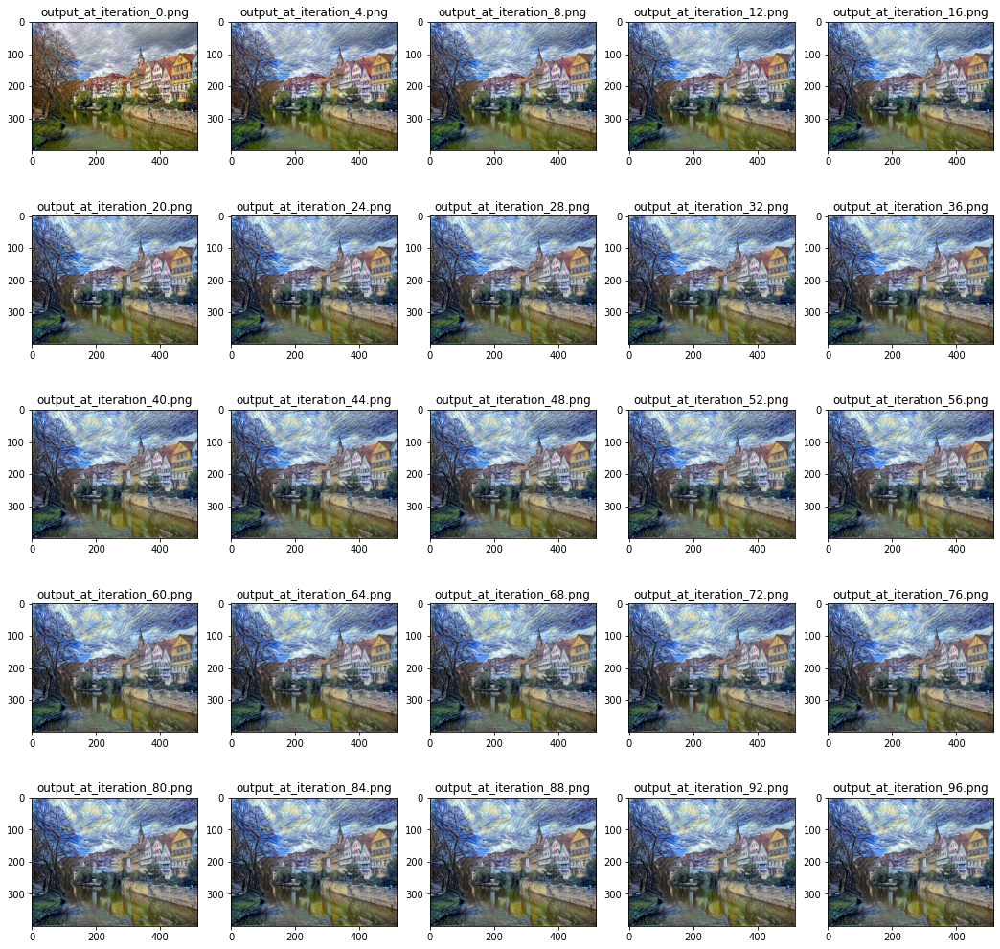

In [98]:
image_path = "/content/output"
plot_styled_images(image_path)

# 8) Generar imágenes para distintas combinaciones de pesos de las losses. Explicar las diferencias (Adjuntar las imágenes generadas como archivos separados).

Respuesta:

Los valores de la funcion de perdida total (total loss) asi como las imagenes generadas por el proceso de transferencia de estilo (style transfer) para cada combinacion de pesos se encuentran disponibles en el repositorio [style-transfer](https://github.com/mgardos/style-transfer).


|     | style weight  | content weight | total variation weight | iterations |
|-----|---------------|----------------|------------------------|------------|
|  a  | 100           | 1              | 0.1                    | 200        |
|  b  | 1000000       | 1              | 0.1                    | 400        |
|  c  | 10000000      | 1              | 0.1                    | 800        |

Al ejecutar el proceso de transferencia de estilo (style transfer) con pesos de estilo ampliamente mayores a los pesos de contenido, lo esperado es que el estilo tome mayor preponderancia y llegue a distorcionar el contenido de la imagen base. En las pruebas listadas en la tabla se observan cambios que son minimos al ojo humano. La funcion de perdida total correspondiente a cada prueba muestra que la convergencia ocurre rapidamente, siendo 100 iteraciones suficiente.

Se crea un directorio adicional para guardar imagenes resultantes de las pruebas con diferentes pesos.

In [ ]:
!mkdir /content/output8

La siguiente clase se define para registrar los valores de la perdida total durante el proceso de transferencia de estilo (style transfer).

In [69]:
class LossCSVRecorder(object):

    def __init__(self, filename):
        self.loss_values_file = open(filename + ".csv","w+")
        self.loss_values_file.write("iteration,loss\n")

    def save_loss(self, iteration, loss_value):
        self.loss_values_file.write(str(iteration) + "," + loss_value + "\n")

    def stop(self):
        self.loss_values_file.close()

Se define la siguiente funcion para facilitar la ejecucion del proceso de transferencia de estilo (style transfer).

In [70]:
def run_style_transfer(base_image_path, iterations, save_img_factor, result_prefix, csv):
    save_factor = 1
    evaluator = Evaluator()

    # run scipy-based optimization (L-BFGS) over the pixels of the generated image
    # so as to minimize the neural style loss
    x = preprocess_image(base_image_path)
    
    for i in range(iterations):
        print('Start of iteration', i)
        start_time = time.time()
        x, min_val, info = fmin_l_bfgs_b(evaluator.loss, x.flatten(),
                                         fprime=evaluator.grads, maxfun=20)
        print('Current loss value:', min_val)
        # save current generated image
        img = deprocess_image(x.copy())
        fname = result_prefix / ('output_at_iteration_%d.png' % i)
        if save_factor == 1:
            save_img(fname, img)
            save_factor = save_img_factor
        else:
          save_factor -= 1
        end_time = time.time()
        csv.save_loss(i, str(min_val.item()))
        print('Image saved as', fname)
        print('Iteration %d completed in %ds' % (i, end_time - start_time))

Se define la siguiente funcion que permite graficar la funcion de perdida total (total loss).

In [71]:
def plot_total_loss(filename):
    data = np.genfromtxt(filename, delimiter=',', skip_header=1,
                         names=['iteration', 'loss'])
    plt.plot(data['iteration'], data['loss'], color='r', label='the data')

### 8.a) Mayor peso de estilo (style weight)

El peso de estilo se incrementa 10 veces respecto a la ejecucion inicial, asi como se cuatriplica el numero de iteraciones.

La siguiente celda es similar a la del punto 1, donde se definen los valores para los pesos aplicados a las funciones de perdida. Ejecutar esta celda en lugar de la celda del punto 1, el resto de las celdas se deben ejecutar en orden.

- [Imagenes](https://github.com/mgardos/style-transfer/tree/master/output8/a)
- [Valores de funcion de perdida total](https://github.com/mgardos/style-transfer/tree/master/output8/8a_total_loss.csv)

In [53]:
total_variation_weight = 0.1
style_weight = 100
content_weight = 1

In [72]:
result_prefix = Path("/content/output8/a")
!mkdir /content/output8/a

In [74]:
iterations = 200
save_img_factor = 2   # guardar una imagen generada cada dos iteraciones

csv = LossCSVRecorder("8a_total_loss")
run_style_transfer(base_image_path, iterations, save_img_factor, result_prefix, csv)
csv.stop()

Start of iteration 0
Current loss value: 106988995000.0
Image saved as /content/output8/a/output_at_iteration_0.png
Iteration 0 completed in 14s
Start of iteration 1
Current loss value: 42466960000.0
Image saved as /content/output8/a/output_at_iteration_1.png
Iteration 1 completed in 13s
Start of iteration 2
Current loss value: 25229212000.0
Image saved as /content/output8/a/output_at_iteration_2.png
Iteration 2 completed in 13s
Start of iteration 3
Current loss value: 16324344000.0
Image saved as /content/output8/a/output_at_iteration_3.png
Iteration 3 completed in 13s
Start of iteration 4
Current loss value: 12499936000.0
Image saved as /content/output8/a/output_at_iteration_4.png
Iteration 4 completed in 14s
Start of iteration 5
Current loss value: 10347227000.0
Image saved as /content/output8/a/output_at_iteration_5.png
Iteration 5 completed in 13s
Start of iteration 6
Current loss value: 8998102000.0
Image saved as /content/output8/a/output_at_iteration_6.png
Iteration 6 completed

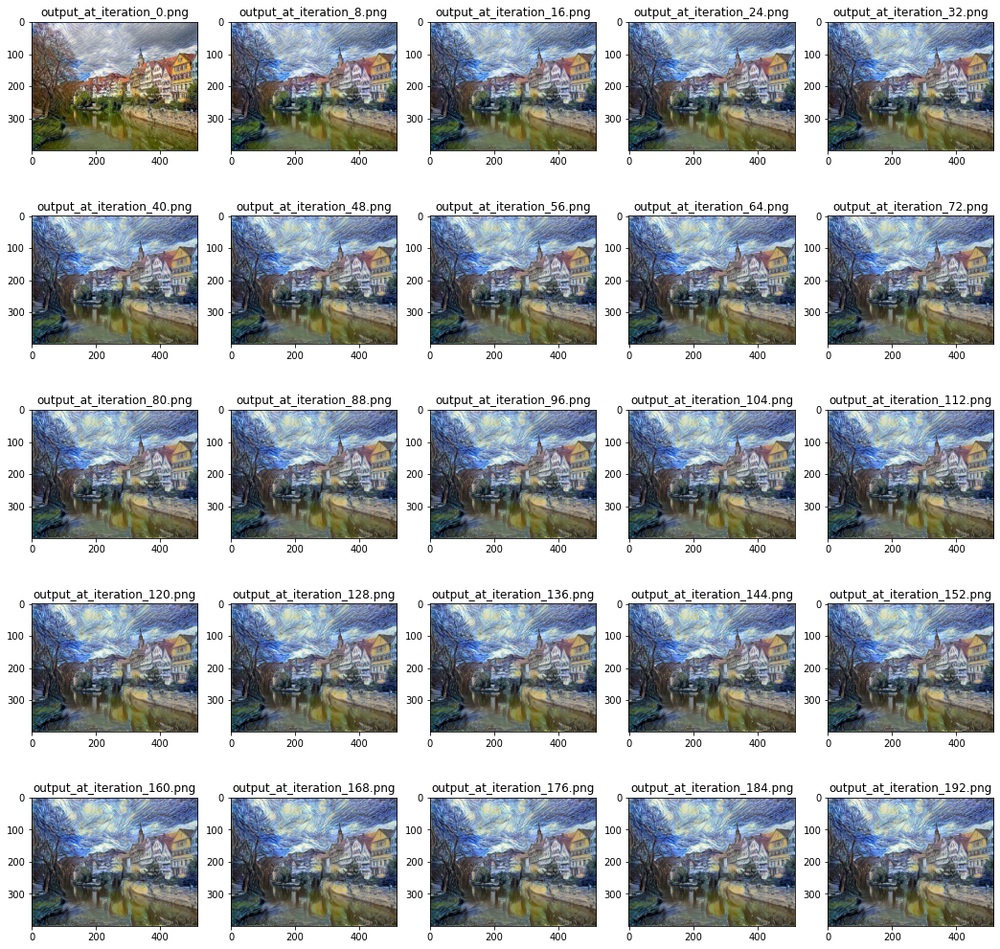

In [75]:
image_path = "/content/output8/a"
plot_styled_images(image_path, image_step=8)

In [76]:
!tar -czf output8_a.tar.gz output8/a

La funcion de perdida total se presenta a continuacion:

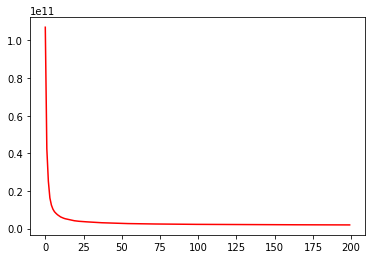

In [77]:
plot_total_loss('8a_total_loss.csv')

### 8.b) Peso de estilo mucho mayor (style weight)

El peso de estilo se incrementa 100000 veces respecto a la ejecucion inicial, asi como se cuatriplica el numero de iteraciones.

La siguiente celda es similar a la del punto 1, donde se definen los valores para los pesos aplicados a las funciones de perdida. Ejecutar esta celda en lugar de la celda del punto 1, el resto de las celdas se deben ejecutar en orde

- [Imagenes](https://github.com/mgardos/style-transfer/tree/master/output8/b)
- [Valores de funcion de perdida total](https://github.com/mgardos/style-transfer/tree/master/output8/8b_total_loss.csv)

In [ ]:
total_variation_weight = 0.1
style_weight = 1000000
content_weight = 1

In [ ]:
result_prefix = Path("/content/output8/b")
!mkdir /content/output8/b

In [ ]:
iterations = 400
save_img_factor = 4   # guardar una imagen generada cada cuatro iteraciones

csv = LossCSVRecorder("8b_total_loss")
run_style_transfer(base_image_path, iterations, save_img_factor, result_prefix, csv)
csv.stop()

Start of iteration 0
Current loss value: 1036017800000000.0
Image saved as /content/output8/b/output_at_iteration_0.png
Iteration 0 completed in 3s
Start of iteration 1
Current loss value: 386810760000000.0
Image saved as /content/output8/b/output_at_iteration_1.png
Iteration 1 completed in 3s
Start of iteration 2
Current loss value: 218810330000000.0
Image saved as /content/output8/b/output_at_iteration_2.png
Iteration 2 completed in 3s
Start of iteration 3
Current loss value: 145674440000000.0
Image saved as /content/output8/b/output_at_iteration_3.png
Iteration 3 completed in 3s
Start of iteration 4
Current loss value: 103759900000000.0
Image saved as /content/output8/b/output_at_iteration_4.png
Iteration 4 completed in 3s
Start of iteration 5
Current loss value: 76196200000000.0
Image saved as /content/output8/b/output_at_iteration_5.png
Iteration 5 completed in 3s
Start of iteration 6
Current loss value: 60291080000000.0
Image saved as /content/output8/b/output_at_iteration_6.png


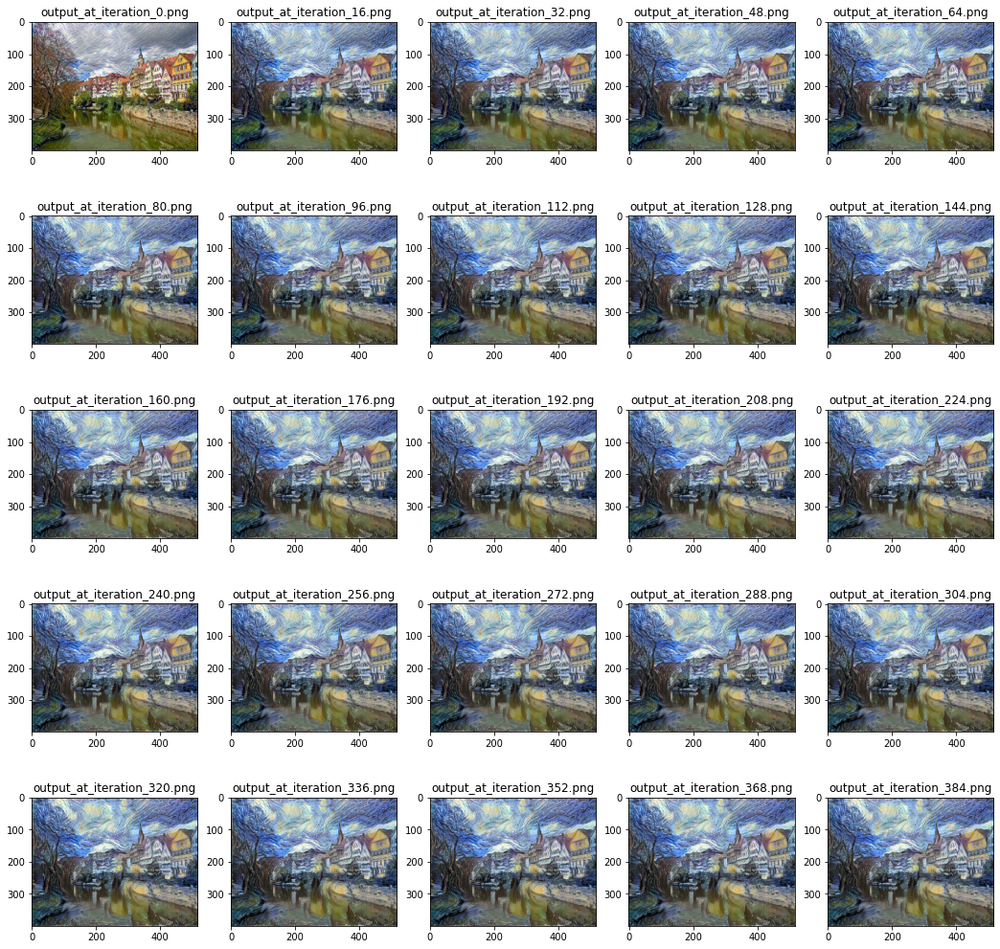

In [ ]:
image_path = "/content/output8/b"
plot_styled_images(image_path, image_step=16)

In [ ]:
!tar -czf output8_b.tar.gz output8/b

La funcion de perdida total se presenta a continuacion:

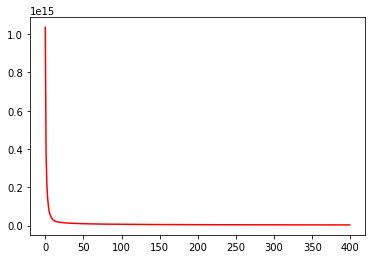

In [ ]:
plot_total_loss('8a_total_loss.csv')

### 8.c) Peso de estilo aun mayor (style weight)

El peso de estilo se incrementa 10 veces mas respecto a la ejecucion del punto 8.b, asi como se duplica el numero de iteraciones respecto al mismo punto.

La siguiente celda es similar a la del punto 1, donde se definen los valores para los pesos aplicados a las funciones de perdida. Ejecutar esta celda en lugar de la celda del punto 1, el resto de las celdas se deben ejecutar en orden.

- [Imagenes](https://github.com/mgardos/style-transfer/tree/master/output8/c)
- [Valores de funcion de perdida total](https://github.com/mgardos/style-transfer/tree/master/output8/8c_total_loss.csv)

In [ ]:
total_variation_weight = 0.1
style_weight = 10000000
content_weight = 1

In [ ]:
result_prefix = Path("/content/output8/c")
!mkdir /content/output8/c

In [ ]:
iterations = 800
save_img_factor = 32   # guardar una imagen generada cada cuatro iteraciones

csv = LossCSVRecorder("8c_total_loss")
run_style_transfer(base_image_path, iterations, save_img_factor, result_prefix, csv)
csv.stop()

Start of iteration 0
Current loss value: 1.0364209e+16
Image saved as /content/output8/c/output_at_iteration_0.png
Iteration 0 completed in 23s
Start of iteration 1
Current loss value: 3809052000000000.0
Image saved as /content/output8/c/output_at_iteration_1.png
Iteration 1 completed in 13s
Start of iteration 2
Current loss value: 2090777300000000.0
Image saved as /content/output8/c/output_at_iteration_2.png
Iteration 2 completed in 13s
Start of iteration 3
Current loss value: 1341462800000000.0
Image saved as /content/output8/c/output_at_iteration_3.png
Iteration 3 completed in 14s
Start of iteration 4
Current loss value: 963707040000000.0
Image saved as /content/output8/c/output_at_iteration_4.png
Iteration 4 completed in 13s
Start of iteration 5
Current loss value: 736954800000000.0
Image saved as /content/output8/c/output_at_iteration_5.png
Iteration 5 completed in 14s
Start of iteration 6
Current loss value: 604153250000000.0
Image saved as /content/output8/c/output_at_iteration_

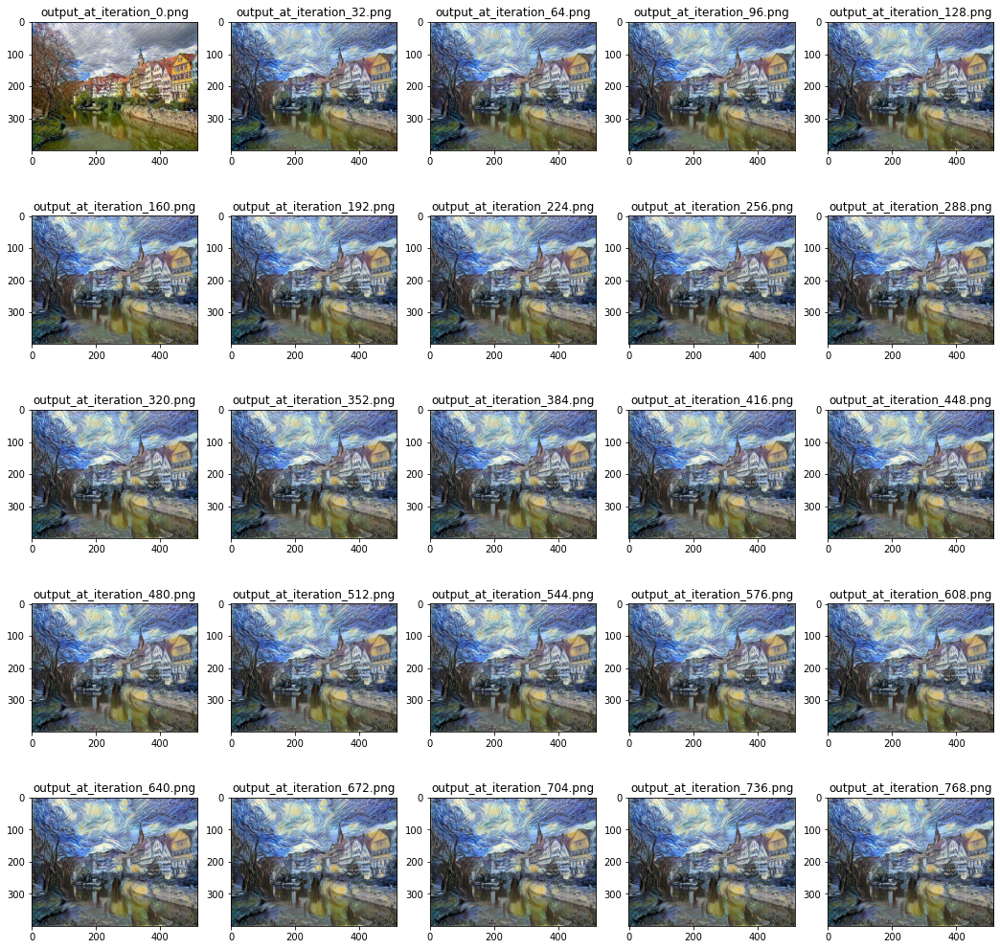

In [ ]:
image_path = "/content/output8/c"
plot_styled_images(image_path, image_step=32)

In [ ]:
!tar -czf output8_c.tar.gz output8/c

La funcion de perdida total se presenta a continuacion:

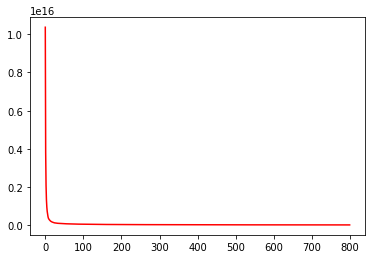

In [ ]:
plot_total_loss('8c_total_loss.csv')

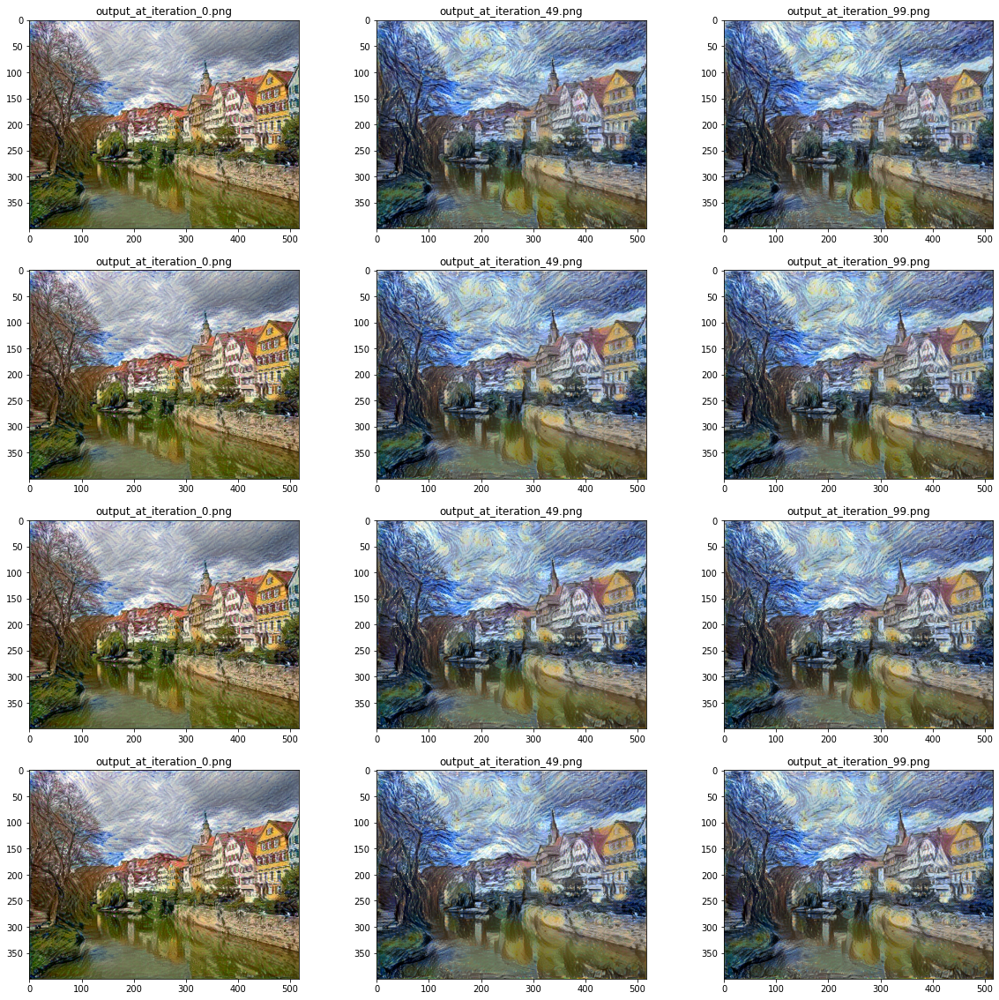

In [ ]:
image_name = "output_at_iteration_"
image_path = ["/content/output", "/content/output8/a", "/content/output8/b", "/content/output8/c"]

f, axarr = plt.subplots(4, 3, figsize=(20, 20))
row = 0
col = 0
img0 = 0
img49 = 49
img99 = 99

for row in range(4):
    col = 0
    name = image_name + str(img0) + ".png"
    a = plt.imread(join(image_path[row], name))
    axarr[row, col].imshow(a)
    axarr[row, col].set_title(name)
    
    col += 1
    name = image_name + str(img49) + ".png"
    a = plt.imread(join(image_path[row], name))
    axarr[row, col].imshow(a)
    axarr[row, col].set_title(name)
    
    col += 1
    name = image_name + str(img99) + ".png"
    a = plt.imread(join(image_path[row], name))
    axarr[row, col].imshow(a)
    axarr[row, col].set_title(name)

# 9) Cambiar las imágenes de contenido y estilo por unas elegidas por usted. Adjuntar el resultado.

Respuesta:

In [ ]:
# Imagen para estilo
!wget https://raw.githubusercontent.com/mgardos/style-transfer/master/style.jpeg

# Imagen para contenido
!wget https://raw.githubusercontent.com/mgardos/style-transfer/master/owl.jpg

# Creamos el directorio para los archivos de salida
!mkdir /content/output9

--2020-06-29 08:22:35--  https://raw.githubusercontent.com/mgardos/style-transfer/master/style.jpeg
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 151.101.0.133, 151.101.64.133, 151.101.128.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|151.101.0.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 22783 (22K) [image/jpeg]
Saving to: ‘style.jpeg’

style.jpeg          100%[===================>]  22.25K  --.-KB/s    in 0.005s  

2020-06-29 08:22:35 (4.30 MB/s) - ‘style.jpeg’ saved [22783/22783]

--2020-06-29 08:22:37--  https://raw.githubusercontent.com/mgardos/style-transfer/master/owl.jpg
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 151.101.0.133, 151.101.64.133, 151.101.128.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|151.101.0.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 103650 (101K) [image/jpeg]
Saving to: ‘owl.jpg’

owl.j

In [ ]:
base_image_path = Path("/content/owl.jpg")
style_reference_image_path = Path("/content/style.jpeg")
result_prefix = Path("/content/output9")
iterations = 100

In [ ]:
total_variation_weight = 0.1
style_weight = 10
content_weight = 1

In [ ]:
width, height = load_img(base_image_path).size
img_nrows = 225
img_ncols = int(width * img_nrows / height)

### Ejecutar las celdas desde el punto 2 al 6 inclusive (las celdas del punto 7 en adelante no se deben ejecutar)

In [ ]:
evaluator = Evaluator()

# run scipy-based optimization (L-BFGS) over the pixels of the generated image
# so as to minimize the neural style loss
x = preprocess_image(base_image_path)

for i in range(iterations):
    print('Start of iteration', i)
    start_time = time.time()
    x, min_val, info = fmin_l_bfgs_b(evaluator.loss, x.flatten(),
                                     fprime=evaluator.grads, maxfun=20)
    print('Current loss value:', min_val)
    # save current generated image
    img = deprocess_image(x.copy())
    fname = result_prefix / ('output_at_iteration_%d.png' % i)
    save_img(fname, img)
    end_time = time.time()
    print('Image saved as', fname)
    print('Iteration %d completed in %ds' % (i, end_time - start_time))

Start of iteration 0
Current loss value: 333702600000.0
Image saved as /content/output9/output_at_iteration_0.png
Iteration 0 completed in 5s
Start of iteration 1
Current loss value: 130137280000.0
Image saved as /content/output9/output_at_iteration_1.png
Iteration 1 completed in 3s
Start of iteration 2
Current loss value: 73316475000.0
Image saved as /content/output9/output_at_iteration_2.png
Iteration 2 completed in 3s
Start of iteration 3
Current loss value: 53045907000.0
Image saved as /content/output9/output_at_iteration_3.png
Iteration 3 completed in 3s
Start of iteration 4
Current loss value: 41825910000.0
Image saved as /content/output9/output_at_iteration_4.png
Iteration 4 completed in 3s
Start of iteration 5
Current loss value: 34790253000.0
Image saved as /content/output9/output_at_iteration_5.png
Iteration 5 completed in 3s
Start of iteration 6
Current loss value: 30006147000.0
Image saved as /content/output9/output_at_iteration_6.png
Iteration 6 completed in 3s
Start of it

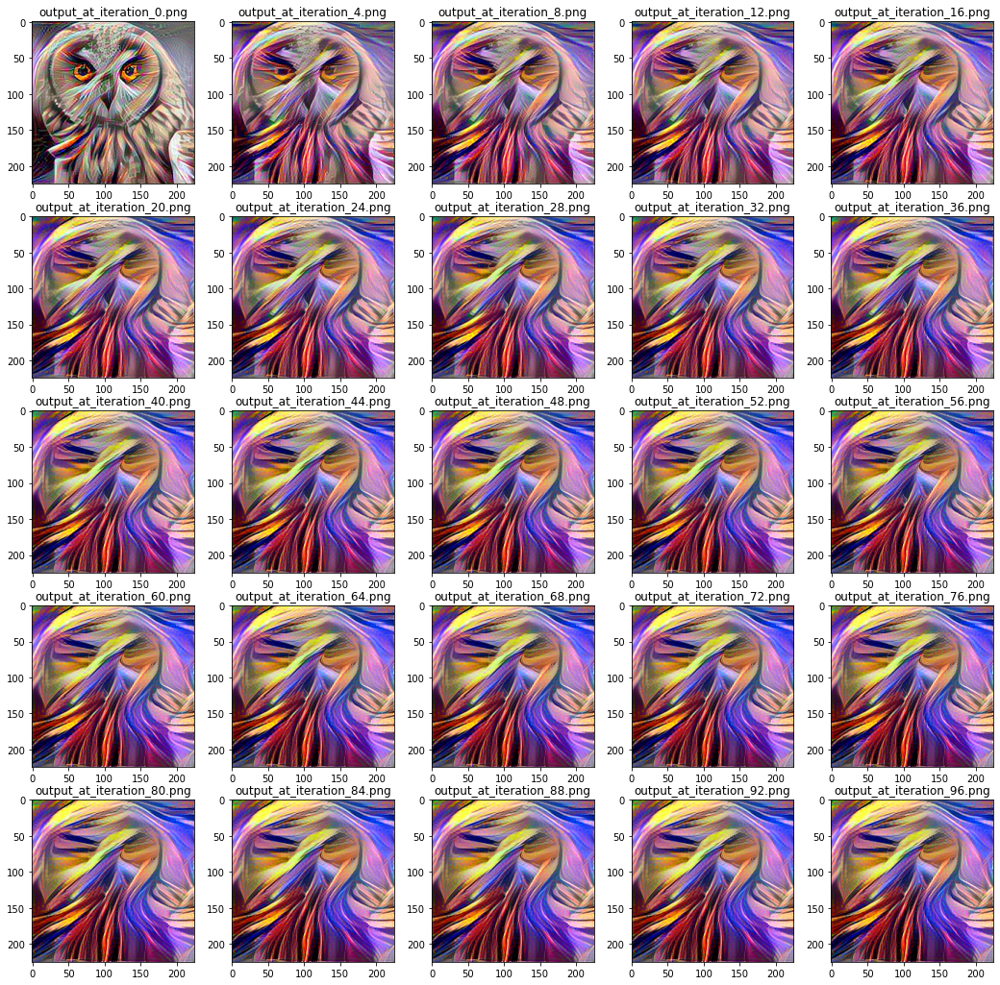

In [ ]:
image_path = "/content/output9"
plot_styled_images(image_path)